In [1]:
library(mashr)
library(dplyr)
library(tidyr)
library(vroom)
library(ggplot2)

Loading required package: ashr


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union




# Load in summary stats (maybe find another way to do this for larger results)

In [2]:
cts <- c('B','Cholangiocyte','Endothelial','Hepatocytes','HSC','Myeloid','NK','T')

In [3]:
in.dir <- '/nfs/lab/tscc/welison/FNIH.Liver/tensorQTL/06_H3K27acQTLs/outs/'
out.dir <- '/nfs/lab/tscc/welison/FNIH.Liver/tensorQTL/06_H3K27acQTLs/outs/mashr/'
dir.create(out.dir)

Warning message in dir.create(out.dir):
“'/nfs/lab/tscc/welison/FNIH.Liver/tensorQTL/06_H3K27acQTLs/outs/mashr' already exists”


In [4]:
full.sum.stats <- list()

for (cell in cts) {
    full.sum.stats[[cell]] <- vroom(paste0(in.dir,cell,'.cis_qtl_pairs.chr.qvalue.tsv'))
}

summary(full.sum.stats)
dim(full.sum.stats[['Hepatocytes']])
head(full.sum.stats[['Hepatocytes']])

Rows: 49740291 Columns: 11
── Column specification ────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: "\t"
chr (2): phenotype_id, variant_id
dbl (8): start_distance, end_distance, af, ma_samples, ma_count, pval_nomina...
lgl (1): sig.qtl

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
Rows: 249920083 Columns: 11
── Column specification ────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: "\t"
chr (2): phenotype_id, variant_id
dbl (8): start_distance, end_distance, af, ma_samples, ma_count, pval_nomina...
lgl (1): sig.qtl

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
Rows: 411121303 Columns: 12
── Column speci

              Length Class       Mode
B             11     spec_tbl_df list
Cholangiocyte 11     spec_tbl_df list
Endothelial   12     spec_tbl_df list
Hepatocytes   12     spec_tbl_df list
HSC           11     spec_tbl_df list
Myeloid       12     spec_tbl_df list
NK            11     spec_tbl_df list
T             12     spec_tbl_df list

[1] 1018657805         12

phenotype_id,variant_id,start_distance,end_distance,af,ma_samples,ma_count,pval_nominal,slope,slope_se,sig.qtl,pval_nominal_threshold
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>,<dbl>
chr1:9595-10594,rs11240777,853983,852985,0.32558140,45,56,0.07937846,-0.2600526,0.1453861,FALSE,3.49233e-06
chr1:9595-10594,rs4970383,893579,892581,0.25000000,37,43,0.84159224,0.0326571,0.1626024,FALSE,3.49233e-06
chr1:9595-10594,rs117039017,900297,899299,0.05232558,9,9,0.56143983,0.2337610,0.4000110,FALSE,3.49233e-06
chr1:9595-10594,rs28612348,901102,900104,0.18023255,27,31,0.05409147,0.3318226,0.1684509,FALSE,3.49233e-06
chr1:9595-10594,rs4475691,901832,900834,0.20348836,30,35,0.21850871,0.2024518,0.1625761,FALSE,3.49233e-06
chr1:9595-10594,rs950122,901888,900890,0.20348836,30,35,0.21850871,0.2024518,0.1625761,FALSE,3.49233e-06


In [5]:
for (cell in cts) {
    print(sum(full.sum.stats[[cell]]$sig.qtl))
}

[1] 0
[1] 0
[1] 1653
[1] 19948
[1] 0
[1] 697
[1] 0
[1] 29


# Get lead signals

In [6]:
sig.signals <- data.frame()
for (cell in cts) {
    ct.res <- read.table(paste0(in.dir,cell,'.qvalue.cis_qtl.txt.gz'), header=T)
    ct.res$cell <- cell
    ct.res <- filter(ct.res, qval < 0.05)
    sig.signals <- rbind(sig.signals, ct.res)
}

dim(sig.signals)
head(sig.signals)

[1] 418  20

,phenotype_id,num_var,beta_shape1,beta_shape2,true_df,pval_true_df,variant_id,start_distance,end_distance,ma_samples,ma_count,af,pval_nominal,slope,slope_se,pval_perm,pval_beta,qval,pval_nominal_threshold,cell
,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
1,chr1:112688264-112689263,3723,1.05034,239.6430,44.4714,1.86770e-08,rs12025785,-25520,-26518,29,32,0.186047,8.01296e-10,1.354280,0.181382,9.999e-05,2.35544e-06,0.01307870,1.16681e-07,Endothelial
2,chr10:3330436-3331435,5120,1.02822,333.2060,44.6126,6.17823e-09,rs1337382,-17326,-18324,42,48,0.279070,2.29864e-10,0.967033,0.123907,9.999e-05,1.40559e-06,0.00926794,6.63338e-08,Endothelial
3,chr10:42644586-42645585,3191,1.05347,106.0440,42.1777,2.46309e-07,rs2484296,-4815,-5813,48,55,0.319767,6.97986e-09,0.928216,0.134873,9.999e-05,1.45149e-05,0.04640280,2.72361e-07,Endothelial
4,chr10:46035643-46036642,1909,1.02519,56.4483,42.0643,3.83361e-09,rs7094791,242,-756,53,66,0.383721,3.58347e-11,0.955521,0.114978,9.999e-05,1.45474e-07,0.00139520,3.78789e-07,Endothelial
5,chr10:51918670-51919669,4855,1.05099,307.1330,44.7388,2.99322e-08,rs12571679,-2662,-3660,44,52,0.302326,1.57219e-09,-0.861673,0.118290,9.999e-05,4.97711e-06,0.02100300,9.16630e-08,Endothelial
6,chr14:30690049-30691048,3057,1.03006,180.5040,44.6864,7.49527e-08,rs229154,-56244,-57242,56,81,0.470930,4.55245e-09,-0.808326,0.115517,9.999e-05,9.53427e-06,0.03531920,1.24923e-07,Endothelial


In [7]:
sig.signals$feature_variant <- paste0(sig.signals$phenotype_id, ":", sig.signals$variant_id)

In [8]:
length(unique(sig.signals$feature_variant))

[1] 417

In [9]:
sig.signals <- arrange(sig.signals, qval) %>%
    filter(!duplicated(feature_variant))
sig.signals

phenotype_id,num_var,beta_shape1,beta_shape2,true_df,pval_true_df,variant_id,start_distance,end_distance,ma_samples,⋯,af,pval_nominal,slope,slope_se,pval_perm,pval_beta,qval,pval_nominal_threshold,cell,feature_variant
<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<int>,<int>,<int>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
chr9:118750822-118751821,4153,1.041670,195.7780,44.8499,1.15859e-17,rs7849252,3776,2778,45,⋯,0.308140,1.29135e-20,1.244880,0.0834513,9.999e-05,5.46590e-16,1.35580e-10,5.68518e-07,Hepatocytes,chr9:118750822-118751821:rs7849252
chr9:133257039-133258038,3980,1.036250,309.8840,44.3835,1.32843e-15,rs529565,17044,16046,43,⋯,0.697674,2.32401e-18,-1.105730,0.0838937,9.999e-05,1.44123e-13,1.52047e-08,7.77748e-08,Endothelial,chr9:133257039-133258038:rs529565
chr20:39648044-39649043,3733,1.045840,167.6220,43.0417,2.90683e-15,rs294426,535,-463,34,⋯,0.761628,1.80165e-18,-1.274270,0.0960812,9.999e-05,1.30223e-13,1.61507e-08,6.89804e-07,Hepatocytes,chr20:39648044-39649043:rs294426
chr20:1588205-1589204,4627,0.975693,325.0430,42.4871,4.48657e-16,rs36101433,28403,27405,24,⋯,0.186047,1.05107e-19,1.085610,0.0764472,9.999e-05,3.02156e-13,3.28489e-08,1.77309e-08,Myeloid,chr20:1588205-1589204:rs36101433
chr3:98692455-98693454,5477,1.037120,188.9260,44.2475,1.00855e-13,rs34211178,-27738,-28736,57,⋯,0.424419,3.66304e-16,-1.063860,0.0917226,9.999e-05,7.50129e-12,4.88771e-07,5.64962e-07,Hepatocytes,chr3:98692455-98693454:rs34211178
chr7:36603094-36604093,4112,1.044290,287.9510,45.0684,8.24524e-14,rs2718179,561,-437,48,⋯,0.319767,5.37298e-16,1.205460,0.1049790,9.999e-05,7.88192e-12,4.88771e-07,3.95921e-07,Hepatocytes,chr7:36603094-36604093:rs2718179
chr12:131850905-131851904,4510,1.069830,277.1970,42.7614,2.64310e-13,rs10751704,512,-486,62,⋯,0.546512,3.69871e-16,-1.217040,0.1049560,9.999e-05,1.39218e-11,6.90650e-07,5.16466e-07,Hepatocytes,chr12:131850905-131851904:rs10751704
chr20:38770406-38771405,3623,1.059090,194.7810,43.8095,6.69035e-13,rs113793312,-17488,-18486,35,⋯,0.220930,2.56317e-15,1.224030,0.1111160,9.999e-05,3.30822e-11,1.02574e-06,6.68719e-07,Hepatocytes,chr20:38770406-38771405:rs113793312
chr22:42544419-42545418,4261,1.060980,279.6150,43.8503,4.68986e-13,rs12160044,-8537,-9535,27,⋯,0.180233,1.72012e-15,1.303840,0.1171020,9.999e-05,3.18748e-11,1.02574e-06,4.73708e-07,Hepatocytes,chr22:42544419-42545418:rs12160044


# Extract lead signal summary stats

In [10]:
sig.signal.sum.stats <- list()

for (cell in cts) {
    full.sum.stats[[cell]]$feature_variant <- paste0(full.sum.stats[[cell]]$phenotype_id, ":", full.sum.stats[[cell]]$variant_id)
    sig.signal.sum.stats[[cell]] <- filter(full.sum.stats[[cell]], feature_variant %in% sig.signals$feature_variant)
}

summary(sig.signal.sum.stats)
dim(sig.signal.sum.stats[['Hepatocytes']])
head(sig.signal.sum.stats[['Hepatocytes']])

              Length Class       Mode
B             12     spec_tbl_df list
Cholangiocyte 12     spec_tbl_df list
Endothelial   13     spec_tbl_df list
Hepatocytes   13     spec_tbl_df list
HSC           12     spec_tbl_df list
Myeloid       13     spec_tbl_df list
NK            12     spec_tbl_df list
T             13     spec_tbl_df list

[1] 396  13

phenotype_id,variant_id,start_distance,end_distance,af,ma_samples,ma_count,pval_nominal,slope,slope_se,sig.qtl,pval_nominal_threshold,feature_variant
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>,<dbl>,<chr>
chr1:19328215-19329214,rs34977587,-44,-1042,0.2209302,37,38,2.682129e-10,1.3601396,0.1752157,TRUE,3.03922e-07,chr1:19328215-19329214:rs34977587
chr1:21439574-21440573,rs1566523,595,-403,0.5116279,62,84,1.661117e-03,-0.4956054,0.1495319,FALSE,4.15922e-07,chr1:21439574-21440573:rs1566523
chr1:30385970-30386969,rs1794319,-10437,-11435,0.7267442,38,47,3.322390e-08,-0.9677268,0.1497886,TRUE,3.40610e-07,chr1:30385970-30386969:rs1794319
chr1:30685021-30686020,rs11590948,-2761,-3759,0.1802325,27,31,1.793683e-10,1.2707697,0.1614332,TRUE,3.50536e-07,chr1:30685021-30686020:rs11590948
chr1:34825267-34826266,rs55714155,-13663,-14661,0.1627907,25,28,2.325269e-10,-1.1519926,0.1476654,TRUE,5.25183e-07,chr1:34825267-34826266:rs55714155
chr1:46526631-46527630,rs1267301,549,-449,0.7965117,30,35,4.515216e-11,-0.9918634,0.1202650,TRUE,7.09848e-07,chr1:46526631-46527630:rs1267301


# Get variant:feature list and select a random set (vignette has 20k-200k)

In [11]:
feature_variant_list <- character()

for (cell in cts) {
    feature_variant_list <- unique(c(feature_variant_list, full.sum.stats[[cell]]$feature_variant))
}

length(feature_variant_list)
head(feature_variant_list)

[1] 1282819205

[1] "chr1:9595-10594:rs11240777"  "chr1:9595-10594:rs4970383"  
[3] "chr1:9595-10594:rs117039017" "chr1:9595-10594:rs28612348" 
[5] "chr1:9595-10594:rs4475691"   "chr1:9595-10594:rs950122"

In [12]:
rand_feature_variant <- feature_variant_list[sample(1:nrow(full.sum.stats[[cell]]), size=200000, replace=F)]

dim(rand_feature_variant)
head(rand_feature_variant)

NULL

[1] "chr6:31203765-31204764:rs13213386"   "chr4:15784598-15785597:rs78966541"  
[3] "chr9:129890092-129891091:rs77885872" "chr20:62938040-62939039:rs13040566" 
[5] "chr6:4135260-4136259:rs11242943"     "chr1:42682784-42683783:rs343378"

In [13]:
rand.signal.sum.stats <- list()

for (cell in cts) {
    rand.signal.sum.stats[[cell]] <- filter(full.sum.stats[[cell]], feature_variant %in% rand_feature_variant)
}

summary(rand.signal.sum.stats)
dim(rand.signal.sum.stats[['Hepatocytes']])
head(rand.signal.sum.stats[['Hepatocytes']])

              Length Class       Mode
B             12     spec_tbl_df list
Cholangiocyte 12     spec_tbl_df list
Endothelial   13     spec_tbl_df list
Hepatocytes   13     spec_tbl_df list
HSC           12     spec_tbl_df list
Myeloid       13     spec_tbl_df list
NK            12     spec_tbl_df list
T             13     spec_tbl_df list

[1] 189461     13

phenotype_id,variant_id,start_distance,end_distance,af,ma_samples,ma_count,pval_nominal,slope,slope_se,sig.qtl,pval_nominal_threshold,feature_variant
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>,<dbl>,<chr>
chr1:180356-181355,rs9442398,905958,904960,0.72093020,43,48,0.3280768,0.19131146,0.1938109,FALSE,2.58032e-06,chr1:180356-181355:rs9442398
chr1:778240-779239,rs61766299,241156,240158,0.50000000,64,86,0.0970642,0.28287694,0.1674660,FALSE,1.24801e-06,chr1:778240-779239:rs61766299
chr1:778240-779239,rs4442317,393163,392165,0.24418604,36,42,0.6024537,-0.09384015,0.1790796,FALSE,1.24801e-06,chr1:778240-779239:rs4442317
chr1:778240-779239,rs112347635,422653,421655,0.05232558,8,9,0.1751856,-0.46357375,0.3373586,FALSE,1.24801e-06,chr1:778240-779239:rs112347635
chr1:827190-828189,rs79875872,395060,394062,0.10465116,16,18,0.9097678,-0.02990708,0.2626325,FALSE,1.04542e-06,chr1:827190-828189:rs79875872
chr1:938028-939027,rs13303010,21164,20166,0.76744187,32,40,0.8007838,0.07145103,0.2817441,FALSE,1.75245e-06,chr1:938028-939027:rs13303010


# Create random mash object and estimate correlation

In [14]:
bhat_rand <- bind_rows(rand.signal.sum.stats, .id = "cell") %>%
    select(cell, feature_variant, slope) %>%
    pivot_wider(names_from = 'cell',values_from = 'slope') %>%
    tibble::column_to_rownames(var='feature_variant') %>%
    as.matrix()

dim(bhat_rand)
head(bhat_rand)

[1] 200000      8

,B,Cholangiocyte,Endothelial,Hepatocytes,HSC,Myeloid,NK,T
chr1:778240-779239:rs61766299,-0.017586472,0.08194596,0.39136380,0.28287694,0.14495467,0.08392139,0.20934816,0.07797617
chr1:778240-779239:rs4442317,-0.041066380,0.21045142,0.02831614,-0.09384015,-0.04016339,-0.11665846,0.02599451,-0.02556960
chr1:778240-779239:rs112347635,-0.248139300,0.28116098,0.46872637,-0.46357375,0.33410367,-0.30064785,0.41832682,-0.28322530
chr1:827190-828189:rs79875872,0.334185200,-0.16236256,0.07480269,-0.02990708,0.38999543,-0.46215525,NA,NA
chr1:966430-967429:rs9329410,-0.027120529,0.35018742,0.12059183,0.03450273,-0.04598026,0.58541334,NA,-0.22418624
chr1:966430-967429:rs4970409,0.008882874,0.31373653,-0.06212962,0.05110263,-0.06962712,0.67457010,NA,-0.13065504


In [15]:
shat_rand <- bind_rows(rand.signal.sum.stats, .id = "cell") %>%
    select(cell, feature_variant, slope_se) %>%
    pivot_wider(names_from = 'cell',values_from = 'slope_se') %>%
    tibble::column_to_rownames(var='feature_variant') %>%
    as.matrix()

dim(shat_rand)
head(shat_rand)

[1] 200000      8

,B,Cholangiocyte,Endothelial,Hepatocytes,HSC,Myeloid,NK,T
chr1:778240-779239:rs61766299,0.1235367,0.1682063,0.1494043,0.1674660,0.1766578,0.1861382,0.1408516,0.1434036
chr1:778240-779239:rs4442317,0.1342626,0.1776291,0.1440512,0.1790796,0.1833129,0.1742613,0.1535564,0.1529751
chr1:778240-779239:rs112347635,0.2364009,0.4248418,0.3100838,0.3373586,0.3477355,0.3644367,0.2899374,0.2949065
chr1:827190-828189:rs79875872,0.2837966,0.2778130,0.2630832,0.2626325,0.3012834,0.2484834,NA,NA
chr1:966430-967429:rs9329410,0.2218420,0.2004784,0.2000270,0.1716635,0.2023445,0.1814376,NA,0.2059373
chr1:966430-967429:rs4970409,0.2318424,0.2033820,0.2059358,0.1773887,0.2092921,0.1793423,NA,0.2139984


In [16]:
sum(rownames(bhat_rand)==rownames(shat_rand)) == nrow(bhat_rand)
sum(colnames(bhat_rand)==colnames(shat_rand)) == ncol(bhat_rand)

[1] TRUE

[1] TRUE

In [17]:
random   = mash_set_data(bhat_rand, shat_rand)
random

$Bhat
                                                   B Cholangiocyte
chr1:778240-779239:rs61766299          -1.758647e-02  8.194596e-02
chr1:778240-779239:rs4442317           -4.106638e-02  2.104514e-01
chr1:778240-779239:rs112347635         -2.481393e-01  2.811610e-01
chr1:827190-828189:rs79875872           3.341852e-01 -1.623626e-01
chr1:966430-967429:rs9329410           -2.712053e-02  3.501874e-01
chr1:966430-967429:rs4970409            8.882874e-03  3.137365e-01
chr1:966430-967429:rs28648687           2.882090e-02  2.774627e-01
chr1:966430-967429:rs76502131           1.253825e-01  1.976493e-02
chr1:966430-967429:rs112491004         -1.028282e-02 -1.515441e-01
chr1:1013034-1014033:rs6696609         -7.235374e-02  4.399919e-02
chr1:1013034-1014033:rs3128109         -1.093796e-01 -1.092031e-01
chr1:1013034-1014033:rs200016087       -3.771275e-02 -1.002149e-01
chr1:1013034-1014033:rs77977351        -2.096566e-02 -7.821439e-02
chr1:1013034-1014033:rs11260537         5.337636e-02  2.

In [18]:
Vhat = estimate_null_correlation_simple(random)
Vhat

,B,Cholangiocyte,Endothelial,Hepatocytes,HSC,Myeloid,NK,T
B,1.0000000000,0.0014487016,0.0001775784,0.003396548,-0.0002783424,0.0059232712,0.0067804894,0.0008352531
Cholangiocyte,0.0014487016,1.0000000000,0.0048148596,0.010346360,0.0040243367,0.0001185295,0.0001798685,-0.0018601461
Endothelial,0.0001775784,0.0048148596,1.0000000000,0.009144146,0.0060240120,0.0073312547,0.0012623658,-0.0013596284
Hepatocytes,0.0033965477,0.0103463604,0.0091441462,1.000000000,0.0108187546,0.0109369749,0.0029917903,0.0090585482
HSC,-0.0002783424,0.0040243367,0.0060240120,0.010818755,1.0000000000,0.0025154883,-0.0038055779,0.0035384072
Myeloid,0.0059232712,0.0001185295,0.0073312547,0.010936975,0.0025154883,1.0000000000,0.0069596350,0.0074477367
NK,0.0067804894,0.0001798685,0.0012623658,0.002991790,-0.0038055779,0.0069596350,1.0000000000,0.0006567838
T,0.0008352531,-0.0018601461,-0.0013596284,0.009058548,0.0035384072,0.0074477367,0.0006567838,1.0000000000


# Recreate random and make strong with correlation matrix from the null (random)

In [19]:
bhat_strong <- bind_rows(sig.signal.sum.stats, .id = "cell") %>%
    select(cell, feature_variant, slope) %>%
    pivot_wider(names_from = 'cell',values_from = 'slope') %>%
    tibble::column_to_rownames(var='feature_variant') %>%
    as.matrix()

dim(bhat_strong)
head(bhat_strong)

[1] 417   8

,B,Cholangiocyte,Endothelial,Hepatocytes,HSC,Myeloid,NK,T
chr1:21439574-21440573:rs1566523,-0.42616957,-0.02963733,0.2018193,-0.4956054,0.1569770,-0.78052497,NA,-0.16681688
chr2:8583413-8584412:rs6725518,0.06437233,-0.30621454,-0.4598709,-0.8566474,NA,-0.09931338,NA,0.01290557
chr3:42489939-42490938:rs435698,0.45386260,0.37315100,NA,0.2942042,NA,0.95938720,NA,NA
chr6:29887928-29888927:rs3928943,-0.42004716,-0.85783010,-0.9780086,-1.0880654,-0.6365569,-0.94702550,-0.4959162,-0.44498637
chr6:29926679-29927678:rs2523972,0.32554638,0.39276270,0.6713644,0.8145535,0.1716373,0.34379247,0.1807468,0.24276742
chr8:8227666-8228665:rs11250200,-0.59646780,-0.82935584,-0.9821561,-0.9691306,-0.7438787,-1.05771460,-0.5489415,-0.57904980


In [20]:
shat_strong <- bind_rows(sig.signal.sum.stats, .id = "cell") %>%
    select(cell, feature_variant, slope_se) %>%
    pivot_wider(names_from = 'cell',values_from = 'slope_se') %>%
    tibble::column_to_rownames(var='feature_variant') %>%
    as.matrix()

dim(shat_strong)
head(shat_strong)

[1] 417   8

,B,Cholangiocyte,Endothelial,Hepatocytes,HSC,Myeloid,NK,T
chr1:21439574-21440573:rs1566523,0.1415939,0.1715699,0.2034616,0.1495319,0.1493127,0.10289706,NA,0.1380149
chr2:8583413-8584412:rs6725518,0.1461392,0.1322195,0.1586241,0.1253701,NA,0.15883127,NA,0.1509628
chr3:42489939-42490938:rs435698,0.1122457,0.1540596,NA,0.1635099,NA,0.12731189,NA,NA
chr6:29887928-29888927:rs3928943,0.2143986,0.1831049,0.2239709,0.1470022,0.2234467,0.22822793,0.2558931,0.1671162
chr6:29926679-29927678:rs2523972,0.1402184,0.1463534,0.1537946,0.1206836,0.1891349,0.15347661,0.1462575,0.1414247
chr8:8227666-8228665:rs11250200,0.1135158,0.1376255,0.1188875,0.1055491,0.1209014,0.09920911,0.1421172,0.1317616


In [21]:
sum(rownames(bhat_strong)==rownames(shat_strong)) == nrow(bhat_strong)
sum(colnames(bhat_strong)==colnames(shat_strong)) == ncol(bhat_strong)

[1] TRUE

[1] TRUE

In [22]:
strong   = mash_set_data(bhat_strong, shat_strong, V = Vhat)
strong

$Bhat
                                                B Cholangiocyte  Endothelial
chr1:21439574-21440573:rs1566523      -0.42616957  -0.029637333  0.201819330
chr2:8583413-8584412:rs6725518         0.06437233  -0.306214540 -0.459870900
chr3:42489939-42490938:rs435698        0.45386260   0.373151000  0.000000000
chr6:29887928-29888927:rs3928943      -0.42004716  -0.857830100 -0.978008600
chr6:29926679-29927678:rs2523972       0.32554638   0.392762700  0.671364370
chr8:8227666-8228665:rs11250200       -0.59646780  -0.829355840 -0.982156100
chr8:8227666-8228665:rs2945269        -0.56366690  -0.716165100 -0.875213300
chr8:143552984-143553983:rs12679647   -0.58970493  -0.749443950 -1.092718000
chr12:108768458-108769457:rs7955873   -0.24148925   0.126632450  0.000000000
chr17:43360571-43361570:rs12942870    -0.53248460  -0.407861050 -0.764823560
chr19:4327928-4328927:rs10413905       0.10633353   0.817979800  0.180461360
chr21:42535406-42536405:rs228048      -0.01148981   0.565146570 -0.028

In [23]:
random   = mash_set_data(bhat_rand, shat_rand, V=Vhat)
random

$Bhat
                                                   B Cholangiocyte
chr1:778240-779239:rs61766299          -1.758647e-02  8.194596e-02
chr1:778240-779239:rs4442317           -4.106638e-02  2.104514e-01
chr1:778240-779239:rs112347635         -2.481393e-01  2.811610e-01
chr1:827190-828189:rs79875872           3.341852e-01 -1.623626e-01
chr1:966430-967429:rs9329410           -2.712053e-02  3.501874e-01
chr1:966430-967429:rs4970409            8.882874e-03  3.137365e-01
chr1:966430-967429:rs28648687           2.882090e-02  2.774627e-01
chr1:966430-967429:rs76502131           1.253825e-01  1.976493e-02
chr1:966430-967429:rs112491004         -1.028282e-02 -1.515441e-01
chr1:1013034-1014033:rs6696609         -7.235374e-02  4.399919e-02
chr1:1013034-1014033:rs3128109         -1.093796e-01 -1.092031e-01
chr1:1013034-1014033:rs200016087       -3.771275e-02 -1.002149e-01
chr1:1013034-1014033:rs77977351        -2.096566e-02 -7.821439e-02
chr1:1013034-1014033:rs11260537         5.337636e-02  2.

In [24]:
saveRDS(random, paste0(out.dir, '241125_WE_200k_random_mashr.RDS'))
saveRDS(strong, paste0(out.dir, '241125_WE_lead_mashr.RDS'))

# Get data driven covariance on the strong

In [25]:
U.pca = cov_pca(strong,5)
U.ed = cov_ed(strong, U.pca)

In [26]:
saveRDS(U.pca, paste0(out.dir, '241125_WE_U.pca.RDS'))
saveRDS(U.ed, paste0(out.dir, '241125_WE_U.ed.RDS'))

# Fit mash to the null set

In [27]:
U.c = cov_canonical(random)
m = mash(random, Ulist = c(U.ed,U.c), outputlevel = 1)

 - Computing 200000 x 400 likelihood matrix.
 - Likelihood calculations took 128.07 seconds.
 - Fitting model with 400 mixture components.
 - Model fitting took 635.65 seconds.


In [28]:
saveRDS(U.c, paste0(out.dir, '241125_WE_U.c.RDS'))
saveRDS(m, paste0(out.dir, '241125_WE_fit_model_m.RDS'))

# Estimate posteriors for set  
Run this again on any additional summary stats we want to estimate, could eventually loop through all

In [29]:
m2 = mash(strong, g=get_fitted_g(m), fixg=TRUE)

 - Computing 417 x 400 likelihood matrix.
 - Likelihood calculations took 0.26 seconds.
 - Computing posterior matrices.
 - Computation allocated took 0.04 seconds.


In [30]:
saveRDS(m2, paste0(out.dir, '241125_WE_lead_estimates_m2.RDS'))

In [31]:
write.table(get_lfsr(m2), paste0(out.dir, '241125_WE_lead_lfsr.tsv'), 
            sep='\t', quote=F, col.names=T, row.names=T)
write.table(get_pm(m2), paste0(out.dir, '241125_WE_lead_post_mean.tsv'), 
            sep='\t', quote=F, col.names=T, row.names=T)
write.table(get_psd(m2), paste0(out.dir, '241125_WE_lead_post_sd.tsv'), 
            sep='\t', quote=F, col.names=T, row.names=T)

In [32]:
head(get_lfsr(m2))

,B,Cholangiocyte,Endothelial,Hepatocytes,HSC,Myeloid,NK,T
chr1:21439574-21440573:rs1566523,3.218617e-01,4.165987e-01,4.733432e-01,3.178703e-01,4.809198e-01,9.510670e-09,4.892500e-01,3.602170e-01
chr2:8583413-8584412:rs6725518,2.551857e-01,1.421604e-03,5.654929e-03,5.365863e-08,6.391894e-02,2.914033e-02,2.429701e-01,1.715597e-01
chr3:42489939-42490938:rs435698,5.576562e-04,1.367735e-03,9.305303e-04,3.565958e-03,1.475027e-03,2.191046e-10,5.984101e-02,6.511540e-03
chr6:29887928-29888927:rs3928943,9.331730e-04,8.980494e-10,1.148016e-08,5.551115e-16,1.088650e-06,1.295804e-08,7.841299e-03,4.285742e-05
chr6:29926679-29927678:rs2523972,4.462178e-03,1.006274e-05,2.190349e-06,8.763502e-12,1.736004e-03,8.048169e-05,4.550895e-02,4.475023e-03
chr8:8227666-8228665:rs11250200,3.244637e-09,1.521006e-13,0.000000e+00,0.000000e+00,2.553513e-15,0.000000e+00,2.614259e-05,5.808436e-09


In [33]:
summary(m)

                  Length  Class  Mode   
result                  0 -none- NULL   
loglik                  1 -none- numeric
vloglik            200000 -none- numeric
null_loglik        200000 -none- numeric
alt_loglik         200000 -none- numeric
fitted_g                4 -none- list   
posterior_weights 4600000 -none- numeric
alpha                   1 -none- numeric

In [34]:
summary(m2)

                  Length Class  Mode   
result               4   -none- list   
loglik               1   -none- numeric
vloglik            417   -none- numeric
null_loglik        417   -none- numeric
alt_loglik         417   -none- numeric
fitted_g             4   -none- list   
posterior_weights 9591   -none- numeric
alpha                1   -none- numeric

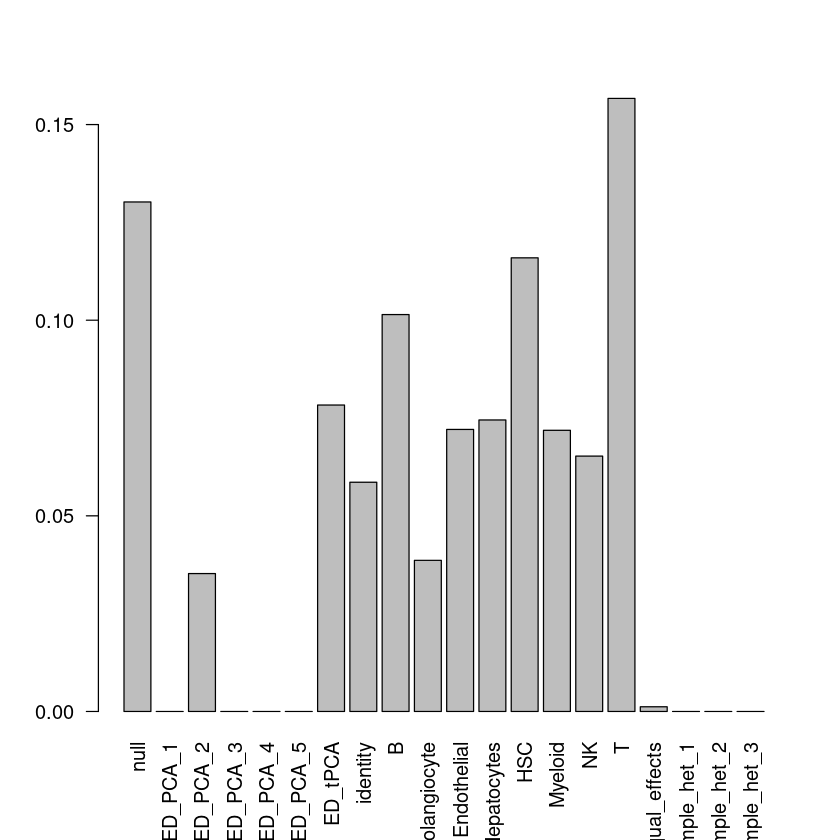

In [35]:
barplot(get_estimated_pi(m2),las = 2)

In [36]:
print(get_pairwise_sharing(m2, factor=0))

                      B Cholangiocyte Endothelial Hepatocytes       HSC
B             1.0000000     1.0000000   1.0000000   0.9947644 1.0000000
Cholangiocyte 1.0000000     1.0000000   0.9839744   1.0000000 0.9965636
Endothelial   1.0000000     0.9839744   1.0000000   0.9482759 1.0000000
Hepatocytes   0.9947644     1.0000000   0.9482759   1.0000000 0.9896104
HSC           1.0000000     0.9965636   1.0000000   0.9896104 1.0000000
Myeloid       1.0000000     0.9867110   1.0000000   0.9822785 1.0000000
NK            1.0000000     1.0000000   1.0000000   0.9947368 1.0000000
T             1.0000000     1.0000000   1.0000000   0.9922078 1.0000000
                Myeloid        NK         T
B             1.0000000 1.0000000 1.0000000
Cholangiocyte 0.9867110 1.0000000 1.0000000
Endothelial   1.0000000 1.0000000 1.0000000
Hepatocytes   0.9822785 0.9947368 0.9922078
HSC           1.0000000 1.0000000 1.0000000
Myeloid       1.0000000 1.0000000 1.0000000
NK            1.0000000 1.0000000 1.0000000


In [37]:
data.frame(matrix(as.numeric(get_lfsr(m2) < .01), ncol=8))

X1,X2,X3,X4,X5,X6,X7,X8
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
0,0,0,0,0,1,0,0
0,1,1,1,0,0,0,0
1,1,1,1,1,1,0,1
1,1,1,1,1,1,1,1
1,1,1,1,1,1,0,1
1,1,1,1,1,1,1,1
1,1,1,1,1,1,1,1
1,1,1,1,1,1,0,1
0,0,0,1,0,0,0,0


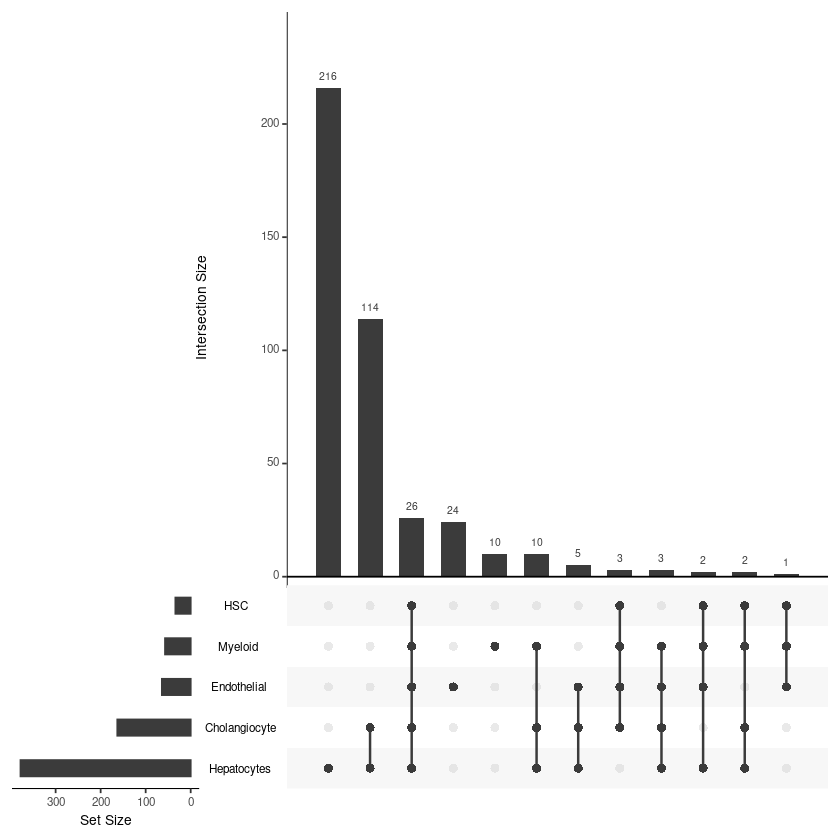

In [38]:
library(UpSetR)

upset_data <- data.frame(matrix(as.numeric(get_lfsr(m2) < .01), ncol=8))
colnames(upset_data) <- colnames(get_lfsr(m2))

upset(upset_data, order.by = "freq")

In [1]:
out.dir <- '/nfs/lab/tscc/welison/FNIH.Liver/tensorQTL/06_H3K27acQTLs/outs/mashr/'
lfsr <- read.table(paste0(out.dir, '241125_WE_lead_lfsr.tsv'), sep='\t', header=T)
dim(lfsr)
head(lfsr)

[1] 417   8

,B,Cholangiocyte,Endothelial,Hepatocytes,HSC,Myeloid,NK,T
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
chr1:21439574-21440573:rs1566523,3.218617e-01,4.165987e-01,4.733432e-01,3.178703e-01,4.809198e-01,9.510670e-09,4.892500e-01,3.602170e-01
chr2:8583413-8584412:rs6725518,2.551857e-01,1.421604e-03,5.654929e-03,5.365863e-08,6.391894e-02,2.914033e-02,2.429701e-01,1.715597e-01
chr3:42489939-42490938:rs435698,5.576562e-04,1.367735e-03,9.305303e-04,3.565958e-03,1.475027e-03,2.191046e-10,5.984101e-02,6.511540e-03
chr6:29887928-29888927:rs3928943,9.331730e-04,8.980494e-10,1.148016e-08,5.551115e-16,1.088650e-06,1.295804e-08,7.841299e-03,4.285742e-05
chr6:29926679-29927678:rs2523972,4.462178e-03,1.006274e-05,2.190349e-06,8.763502e-12,1.736004e-03,8.048169e-05,4.550895e-02,4.475023e-03
chr8:8227666-8228665:rs11250200,3.244637e-09,1.521006e-13,0.000000e+00,0.000000e+00,2.553513e-15,0.000000e+00,2.614259e-05,5.808436e-09


In [8]:
# Apply function to check conditions
result <- apply(lfsr, 1, function(row) {
  any_below_0.05 <- any(row < 0.05)       # Check if any value is below 0.05
  all_others_above_0.125 <- all(row[row >= 0.05] > 0.125) # Check if others are above 0.125
  any_below_0.05 & all_others_above_0.125 # Return TRUE if both conditions are met
})

# Add result as a new column
lfsr$spec <- result

# View the updated data frame
print(lfsr)

                                                 B Cholangiocyte  Endothelial
chr1:21439574-21440573:rs1566523      3.218617e-01  4.165987e-01 4.733432e-01
chr2:8583413-8584412:rs6725518        2.551857e-01  1.421604e-03 5.654929e-03
chr3:42489939-42490938:rs435698       5.576562e-04  1.367735e-03 9.305303e-04
chr6:29887928-29888927:rs3928943      9.331730e-04  8.980494e-10 1.148016e-08
chr6:29926679-29927678:rs2523972      4.462178e-03  1.006274e-05 2.190349e-06
chr8:8227666-8228665:rs11250200       3.244637e-09  1.521006e-13 0.000000e+00
chr8:8227666-8228665:rs2945269        1.791825e-07  4.660317e-11 0.000000e+00
chr8:143552984-143553983:rs12679647   1.017798e-03  2.434339e-07 1.459140e-07
chr12:108768458-108769457:rs7955873   2.528043e-01  2.836944e-01 3.621300e-01
chr17:43360571-43361570:rs12942870    1.447143e-03  2.985111e-05 2.239769e-05
chr19:4327928-4328927:rs10413905      5.882436e-02  1.267668e-10 1.611659e-02
chr21:42535406-42536405:rs228048      3.774479e-01  1.361786e-03

In [11]:
length(result)

[1] 417

In [10]:
lfsr[lfsr$spec,]


,B,Cholangiocyte,Endothelial,Hepatocytes,HSC,Myeloid,NK,T,spec
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>
chr1:21439574-21440573:rs1566523,3.218617e-01,4.165987e-01,4.733432e-01,3.178703e-01,4.809198e-01,9.510670e-09,4.892500e-01,3.602170e-01,TRUE
chr6:29887928-29888927:rs3928943,9.331730e-04,8.980494e-10,1.148016e-08,5.551115e-16,1.088650e-06,1.295804e-08,7.841299e-03,4.285742e-05,TRUE
chr6:29926679-29927678:rs2523972,4.462178e-03,1.006274e-05,2.190349e-06,8.763502e-12,1.736004e-03,8.048169e-05,4.550895e-02,4.475023e-03,TRUE
chr8:8227666-8228665:rs11250200,3.244637e-09,1.521006e-13,0.000000e+00,0.000000e+00,2.553513e-15,0.000000e+00,2.614259e-05,5.808436e-09,TRUE
chr8:8227666-8228665:rs2945269,1.791825e-07,4.660317e-11,0.000000e+00,0.000000e+00,5.546674e-13,0.000000e+00,1.523187e-05,2.913574e-08,TRUE
chr8:143552984-143553983:rs12679647,1.017798e-03,2.434339e-07,1.459140e-07,0.000000e+00,2.325274e-05,2.535674e-09,1.954630e-02,8.740973e-04,TRUE
chr12:108768458-108769457:rs7955873,2.528043e-01,2.836944e-01,3.621300e-01,3.096810e-05,3.111995e-01,2.016837e-01,4.246278e-01,3.522730e-01,TRUE
chr17:43360571-43361570:rs12942870,1.447143e-03,2.985111e-05,2.239769e-05,1.755130e-10,6.078097e-05,4.402060e-08,4.436417e-02,1.012054e-03,TRUE
chr21:42535406-42536405:rs228048,3.774479e-01,1.361786e-03,4.555797e-01,4.740070e-11,2.683935e-01,4.731669e-01,3.768013e-01,3.361327e-01,TRUE


In [6]:
?cumany

In [2]:
library(dplyr)

In [5]:
out.dir <- '/nfs/lab/tscc/welison/FNIH.Liver/tensorQTL/06_H3K27acQTLs/outs/mashr/'
lfsr <- read.table(paste0(out.dir, '241125_WE_lead_lfsr.tsv'), sep='\t', header=T)
dim(lfsr)
head(lfsr)

library(UpSetR)

pdf('/nfs/lab/welison/Liver/Plots/241213_WE_H3K27ac_QTL_Specificifty_Upset.pdf', height=6, width=8)

upset_data <- data.frame(matrix(as.numeric(lfsr < .01), ncol=8))
colnames(upset_data) <- colnames(lfsr)

upset(upset_data, order.by = "freq", text.scale = 2, nintersects=15)

dev.off()

[1] 417   8

,B,Cholangiocyte,Endothelial,Hepatocytes,HSC,Myeloid,NK,T
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
chr1:21439574-21440573:rs1566523,3.218617e-01,4.165987e-01,4.733432e-01,3.178703e-01,4.809198e-01,9.510670e-09,4.892500e-01,3.602170e-01
chr2:8583413-8584412:rs6725518,2.551857e-01,1.421604e-03,5.654929e-03,5.365863e-08,6.391894e-02,2.914033e-02,2.429701e-01,1.715597e-01
chr3:42489939-42490938:rs435698,5.576562e-04,1.367735e-03,9.305303e-04,3.565958e-03,1.475027e-03,2.191046e-10,5.984101e-02,6.511540e-03
chr6:29887928-29888927:rs3928943,9.331730e-04,8.980494e-10,1.148016e-08,5.551115e-16,1.088650e-06,1.295804e-08,7.841299e-03,4.285742e-05
chr6:29926679-29927678:rs2523972,4.462178e-03,1.006274e-05,2.190349e-06,8.763502e-12,1.736004e-03,8.048169e-05,4.550895e-02,4.475023e-03
chr8:8227666-8228665:rs11250200,3.244637e-09,1.521006e-13,0.000000e+00,0.000000e+00,2.553513e-15,0.000000e+00,2.614259e-05,5.808436e-09


png 
  2

### All upset together

In [14]:
library(ComplexUpset)

ERROR: Error in library(ComplexUpset): there is no package called ‘ComplexUpset’


[1] 417   8

,B,Cholangiocyte,Endothelial,Hepatocytes,HSC,Myeloid,NK,T
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
chr1:21439574-21440573:rs1566523,3.218617e-01,4.165987e-01,4.733432e-01,3.178703e-01,4.809198e-01,9.510670e-09,4.892500e-01,3.602170e-01
chr2:8583413-8584412:rs6725518,2.551857e-01,1.421604e-03,5.654929e-03,5.365863e-08,6.391894e-02,2.914033e-02,2.429701e-01,1.715597e-01
chr3:42489939-42490938:rs435698,5.576562e-04,1.367735e-03,9.305303e-04,3.565958e-03,1.475027e-03,2.191046e-10,5.984101e-02,6.511540e-03
chr6:29887928-29888927:rs3928943,9.331730e-04,8.980494e-10,1.148016e-08,5.551115e-16,1.088650e-06,1.295804e-08,7.841299e-03,4.285742e-05
chr6:29926679-29927678:rs2523972,4.462178e-03,1.006274e-05,2.190349e-06,8.763502e-12,1.736004e-03,8.048169e-05,4.550895e-02,4.475023e-03
chr8:8227666-8228665:rs11250200,3.244637e-09,1.521006e-13,0.000000e+00,0.000000e+00,2.553513e-15,0.000000e+00,2.614259e-05,5.808436e-09


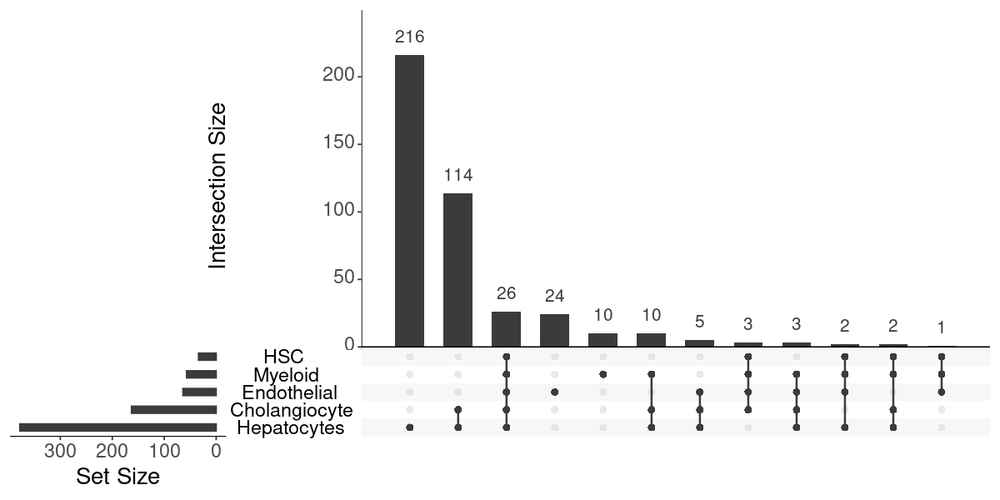

In [3]:
out.dir <- '/nfs/lab/tscc/welison/FNIH.Liver/tensorQTL/06_H3K27acQTLs/outs/mashr/'
lfsr <- read.table(paste0(out.dir, '241125_WE_lead_lfsr.tsv'), sep='\t', header=T)
dim(lfsr)
head(lfsr)

options(repr.plot.width=10, repr.plot.height=5)

library(UpSetR)

#pdf('/nfs/lab/welison/Liver/Plots/241222_WE_H3K27ac_QTL_Specificifty_Upset.pdf', height=5, width=10)

upset_data <- data.frame(matrix(as.numeric(lfsr < .01), ncol=8))
colnames(upset_data) <- colnames(lfsr)

upset(upset_data, order.by = "freq", text.scale = 2, nintersects=15)

#dev.off()

In [4]:
# Assuming df is your data frame
upset_data_ggplot <- upset_data %>%
    select(Cholangiocyte,Endothelial, Myeloid, HSC, Hepatocytes) %>%
  rowwise() %>%
  mutate(
    category = case_when(
      sum(c_across(Cholangiocyte:Hepatocytes) == 1) == 1 & Cholangiocyte == 1 ~ "Cholangiocyte",
      sum(c_across(Cholangiocyte:Hepatocytes) == 1) == 1 & Endothelial == 1 ~ "Endothelial",
      sum(c_across(Cholangiocyte:Hepatocytes) == 1) == 1 & Hepatocytes == 1 ~ "Hepatocytes",
      sum(c_across(Cholangiocyte:Hepatocytes) == 1) == 1 & HSC == 1 ~ "HSC",
      sum(c_across(Cholangiocyte:Hepatocytes) == 1) == 1 & Myeloid == 1 ~ "Myeloid",
      #sum(c_across(Cholangiocyte:T) == 1) == 1 & NK == 1 ~ "NK",
      #sum(c_across(Cholangiocyte:T) == 1) == 1 & T == 1 ~ "T",
      all(c_across(Cholangiocyte:Hepatocytes) == 1) ~ "All",
      TRUE ~ "Other"
    )
  ) %>%
  ungroup()

# Summarize counts for the bar plot
summary_df_H3K27ac <- upset_data_ggplot %>%
  group_by(category) %>%
  summarise(count = n()) %>%
    mutate(modality='H3K27ac')

summary_df_H3K27ac

category,count,modality
<chr>,<int>,<chr>
All,26,H3K27ac
Endothelial,24,H3K27ac
Hepatocytes,216,H3K27ac
Myeloid,10,H3K27ac
Other,141,H3K27ac


[1] 10198     8

,B,Cholangiocyte,Endothelial,Hepatocytes,HSC,Myeloid,NK,T
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
chr1-1692642-1692942:rs6695303,4.998708e-06,2.769574e-09,7.885468e-08,8.744561e-12,5.206649e-07,1.001646e-07,2.852537e-07,1.302514e-08
chr1-1692642-1692942:rs1062090,8.072153e-08,1.120104e-12,5.662137e-15,2.563126e-10,1.121625e-11,4.843381e-11,5.143097e-09,1.747171e-10
chr1-1746281-1746581:rs6695303,1.490714e-07,7.068595e-16,4.572129e-10,1.015848e-12,6.875915e-14,4.288554e-13,5.984611e-12,5.839702e-13
chr1-1890996-1891296:rs6603802,1.592476e-03,4.187899e-05,6.813244e-11,3.998245e-15,2.460050e-05,2.799131e-03,8.876283e-04,1.014163e-04
chr1-1891323-1891623:rs61422524,5.135247e-11,3.795786e-23,6.808187e-28,5.738074e-43,1.026215e-16,3.699745e-24,1.036820e-12,8.687290e-24
chr1-1891323-1891623:rs915292,5.125210e-13,5.695672e-26,9.679670e-37,2.257430e-51,5.453405e-23,5.212239e-42,3.151159e-15,4.616332e-31


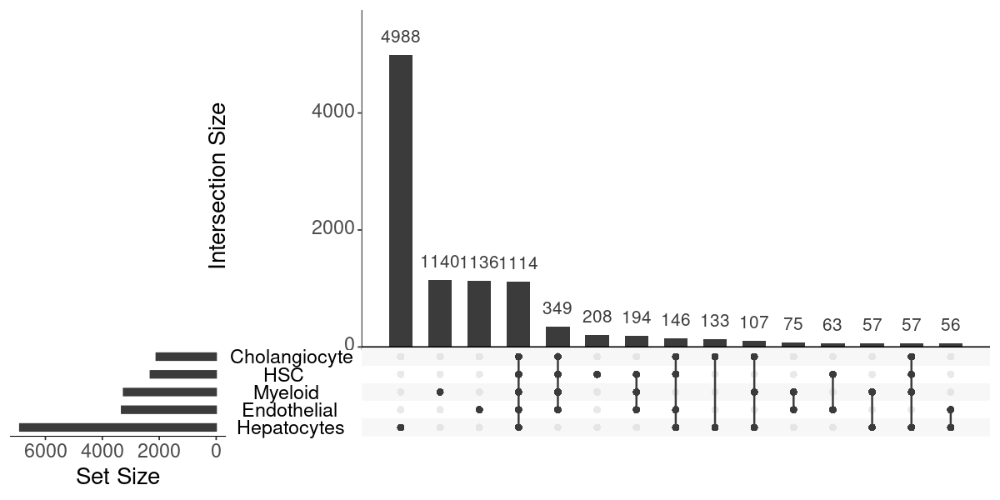

In [6]:
out.dir <- '/nfs/lab/tscc/welison/FNIH.Liver/tensorQTL/05_caQTLs/outs/mashr/'
lfsr <- read.table(paste0(out.dir, '241125_WE_lead_lfsr.tsv'), sep='\t', header=T)
dim(lfsr)
head(lfsr)

library(UpSetR)

#pdf('/nfs/lab/welison/Liver/Plots/241222_WE_ATAC_QTL_Specificifty_Upset.pdf', height=5, width=10)

upset_data <- data.frame(matrix(as.numeric(lfsr < .01), ncol=8))
colnames(upset_data) <- colnames(lfsr)

upset(upset_data, order.by = "freq", text.scale = 2, nintersects=15)

#dev.off()

In [7]:
# Assuming df is your data frame
upset_data_ggplot <- upset_data %>%
    select(Cholangiocyte,Endothelial, Myeloid, HSC, Hepatocytes) %>%
  rowwise() %>%
  mutate(
    category = case_when(
      sum(c_across(Cholangiocyte:Hepatocytes) == 1) == 1 & Cholangiocyte == 1 ~ "Cholangiocyte",
      sum(c_across(Cholangiocyte:Hepatocytes) == 1) == 1 & Endothelial == 1 ~ "Endothelial",
      sum(c_across(Cholangiocyte:Hepatocytes) == 1) == 1 & Hepatocytes == 1 ~ "Hepatocytes",
      sum(c_across(Cholangiocyte:Hepatocytes) == 1) == 1 & HSC == 1 ~ "HSC",
      sum(c_across(Cholangiocyte:Hepatocytes) == 1) == 1 & Myeloid == 1 ~ "Myeloid",
      #sum(c_across(Cholangiocyte:T) == 1) == 1 & NK == 1 ~ "NK",
      #sum(c_across(Cholangiocyte:T) == 1) == 1 & T == 1 ~ "T",
      all(c_across(Cholangiocyte:Hepatocytes) == 1) ~ "All",
      TRUE ~ "Other"
    )
  ) %>%
  ungroup()

# Summarize counts for the bar plot
summary_df_ATAC <- upset_data_ggplot %>%
  group_by(category) %>%
  summarise(count = n()) %>%
    mutate(modality='ATAC')

summary_df_ATAC

category,count,modality
<chr>,<int>,<chr>
All,1114,ATAC
Cholangiocyte,10,ATAC
Endothelial,1136,ATAC
HSC,208,ATAC
Hepatocytes,4988,ATAC
Myeloid,1140,ATAC
Other,1602,ATAC


[1] 391   8

,B,Cholangiocyte,Endothelial,Hepatocytes,HSC,Myeloid,NK,T
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
chr2:113502353-113503852:rs77637430,1.126413e-04,1.520821e-06,4.173494e-07,1.514344e-12,1.896359e-03,1.781018e-05,4.272658e-04,8.307225e-05
chr5:178584897-178586396:rs540371,2.699431e-10,0.000000e+00,8.659740e-15,0.000000e+00,1.728506e-12,1.110223e-16,3.529305e-06,2.738511e-10
chr5:178584897-178586396:rs262042,4.391025e-09,0.000000e+00,2.614575e-13,0.000000e+00,1.948330e-12,8.437695e-15,6.312273e-06,1.484939e-09
chr14:105161822-105163321:rs2280797,6.110699e-04,5.106511e-04,1.026158e-05,2.136206e-26,1.596019e-04,2.072571e-09,1.005556e-03,5.048537e-05
chr1:11393161-11394660:rs55990971,9.982714e-01,9.983743e-01,9.983672e-01,6.045298e-05,9.982545e-01,9.979859e-01,9.982874e-01,9.982664e-01
chr1:152600968-152602467:rs6677595,1.250564e-04,4.697682e-05,1.250563e-04,0.000000e+00,1.250563e-04,1.250563e-04,1.250568e-04,1.250564e-04


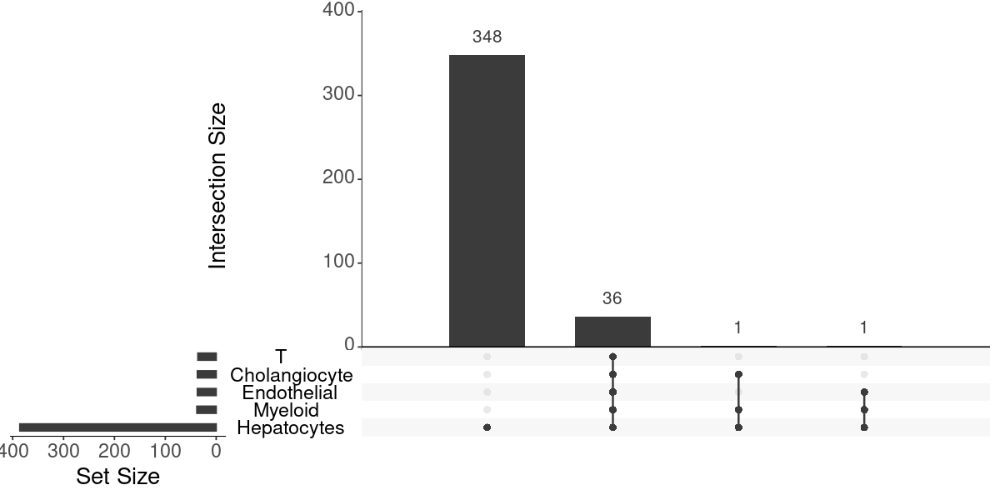

In [8]:
out.dir <- '/nfs/lab/tscc/welison/FNIH.Liver/tensorQTL/07_H3K27me3QTLs/outs/mashr/'
lfsr <- read.table(paste0(out.dir, '241125_WE_lead_lfsr.tsv'), sep='\t', header=T)
dim(lfsr)
head(lfsr)

library(UpSetR)

#pdf('/nfs/lab/welison/Liver/Plots/241222_WE_H3K27me3_QTL_Specificifty_Upset.pdf', height=5, width=10)

upset_data <- data.frame(matrix(as.numeric(lfsr < .01), ncol=8))
colnames(upset_data) <- colnames(lfsr)

upset(upset_data, order.by = "freq", text.scale = 2, nintersects=15)

#dev.off()

In [9]:
# Assuming df is your data frame
upset_data_ggplot <- upset_data %>%
    select(Cholangiocyte,Endothelial, Myeloid, HSC, Hepatocytes) %>%
  rowwise() %>%
  mutate(
    category = case_when(
      sum(c_across(Cholangiocyte:Hepatocytes) == 1) == 1 & Cholangiocyte == 1 ~ "Cholangiocyte",
      sum(c_across(Cholangiocyte:Hepatocytes) == 1) == 1 & Endothelial == 1 ~ "Endothelial",
      sum(c_across(Cholangiocyte:Hepatocytes) == 1) == 1 & Hepatocytes == 1 ~ "Hepatocytes",
      sum(c_across(Cholangiocyte:Hepatocytes) == 1) == 1 & HSC == 1 ~ "HSC",
      sum(c_across(Cholangiocyte:Hepatocytes) == 1) == 1 & Myeloid == 1 ~ "Myeloid",
      #sum(c_across(Cholangiocyte:T) == 1) == 1 & NK == 1 ~ "NK",
      #sum(c_across(Cholangiocyte:T) == 1) == 1 & T == 1 ~ "T",
      all(c_across(Cholangiocyte:Hepatocytes) == 1) ~ "All",
      TRUE ~ "Other"
    )
  ) %>%
  ungroup()

# Summarize counts for the bar plot
summary_df_H3K27me3 <- upset_data_ggplot %>%
  group_by(category) %>%
  summarise(count = n()) %>%
    mutate(modality='H3K27me3')

summary_df_H3K27me3

category,count,modality
<chr>,<int>,<chr>
All,36,H3K27me3
Hepatocytes,348,H3K27me3
Other,7,H3K27me3


[1] 1503    8

,B,Cholangiocyte,Endothelial,Hepatocytes,HSC,Myeloid,NK,T
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
SSU72:rs2453567,0.85606196,0.7564693130,0.002059214,8.044823e-01,0.75109479,8.000281e-01,0.82743669,0.8554969
PRKCZ:rs12410859,0.74124829,0.8037397920,0.771105147,7.206494e-01,0.72054650,6.924803e-04,0.69942062,0.7531656
CEP104:rs6663840,0.02838375,0.0006151098,0.279442236,3.142286e-11,0.01481013,1.016553e-04,0.05156686,0.1534803
NPHP4:rs806111,0.99539618,0.9950323482,0.995736691,3.178123e-31,0.99523688,9.969058e-01,0.99559178,0.9956309
EYA3:rs6598888,0.95500011,0.9555617176,0.950026180,9.607890e-01,0.95646387,4.407864e-05,0.95602096,0.9626096
EYA3:rs12139137,0.44891117,0.1296896460,0.125986873,6.422787e-05,0.39114895,2.882506e-02,0.29221765,0.3030239


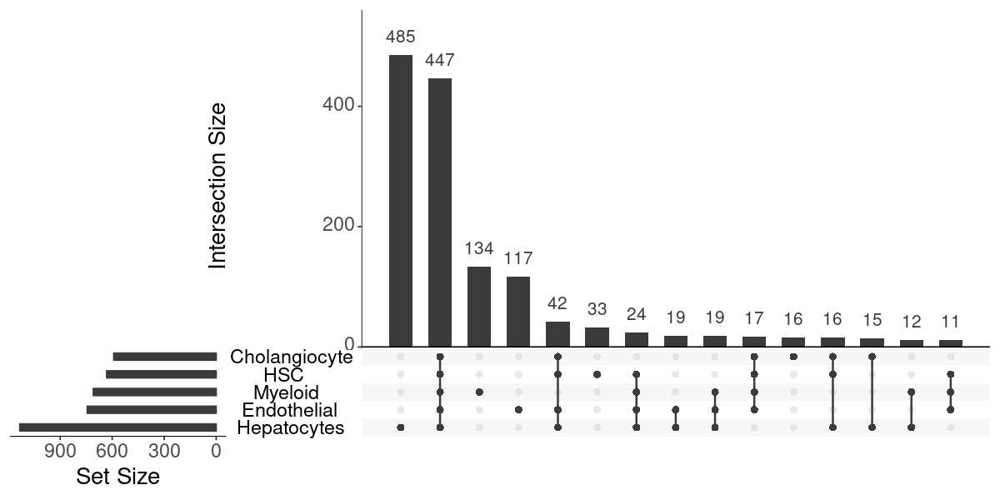

In [10]:
out.dir <- '/nfs/lab/tscc/welison/FNIH.Liver/tensorQTL/04_eQTLs/outs/mashr/'
lfsr <- read.table(paste0(out.dir, '241125_WE_lead_lfsr.tsv'), sep='\t', header=T)
dim(lfsr)
head(lfsr)

library(UpSetR)

#pdf('/nfs/lab/welison/Liver/Plots/241222_WE_RNA_QTL_Specificifty_Upset.pdf', height=5, width=10)

upset_data <- data.frame(matrix(as.numeric(lfsr < .01), ncol=8))
colnames(upset_data) <- colnames(lfsr)

upset(upset_data, order.by = "freq", text.scale = 2, nintersects=15)

#dev.off()

In [11]:
# Assuming df is your data frame
upset_data_ggplot <- upset_data %>%
    select(Cholangiocyte,Endothelial, Myeloid, HSC, Hepatocytes) %>%
  rowwise() %>%
  mutate(
    category = case_when(
      sum(c_across(Cholangiocyte:Hepatocytes) == 1) == 1 & Cholangiocyte == 1 ~ "Cholangiocyte",
      sum(c_across(Cholangiocyte:Hepatocytes) == 1) == 1 & Endothelial == 1 ~ "Endothelial",
      sum(c_across(Cholangiocyte:Hepatocytes) == 1) == 1 & Hepatocytes == 1 ~ "Hepatocytes",
      sum(c_across(Cholangiocyte:Hepatocytes) == 1) == 1 & HSC == 1 ~ "HSC",
      sum(c_across(Cholangiocyte:Hepatocytes) == 1) == 1 & Myeloid == 1 ~ "Myeloid",
      #sum(c_across(Cholangiocyte:T) == 1) == 1 & NK == 1 ~ "NK",
      #sum(c_across(Cholangiocyte:T) == 1) == 1 & T == 1 ~ "T",
      all(c_across(Cholangiocyte:Hepatocytes) == 1) ~ "All",
      TRUE ~ "Other"
    )
  ) %>%
  ungroup()

# Summarize counts for the bar plot
summary_df_RNA <- upset_data_ggplot %>%
  group_by(category) %>%
  summarise(count = n()) %>%
    mutate(modality='RNA')

summary_df_RNA

category,count,modality
<chr>,<int>,<chr>
All,447,RNA
Cholangiocyte,16,RNA
Endothelial,117,RNA
HSC,33,RNA
Hepatocytes,485,RNA
Myeloid,134,RNA
Other,271,RNA


In [12]:
ggplot.data <- rbind(summary_df_RNA, summary_df_ATAC) %>%
    rbind(summary_df_H3K27ac) %>%
    rbind(summary_df_H3K27me3) %>%
    group_by(modality) %>%
    mutate(prop=count / (sum(count)))
ggplot.data

category,count,modality,prop
<chr>,<int>,<chr>,<dbl>
All,447,RNA,0.2974051896
Cholangiocyte,16,RNA,0.0106453759
Endothelial,117,RNA,0.0778443114
HSC,33,RNA,0.0219560878
Hepatocytes,485,RNA,0.3226879574
Myeloid,134,RNA,0.0891550233
Other,271,RNA,0.1803060546
All,1114,ATAC,0.1092371053
Cholangiocyte,10,ATAC,0.0009805844


In [31]:
spec_colors <- c(         
  Endothelial = "#CF1B14", 
  Myeloid = "#E8773B",        
  Cholangiocyte = "#E1AD01",
  HSC = "#4682B4",    
  Hepatocytes = "#4DAF4A",
  All='#815D47',
  Other='snow3'
)

png 
  2

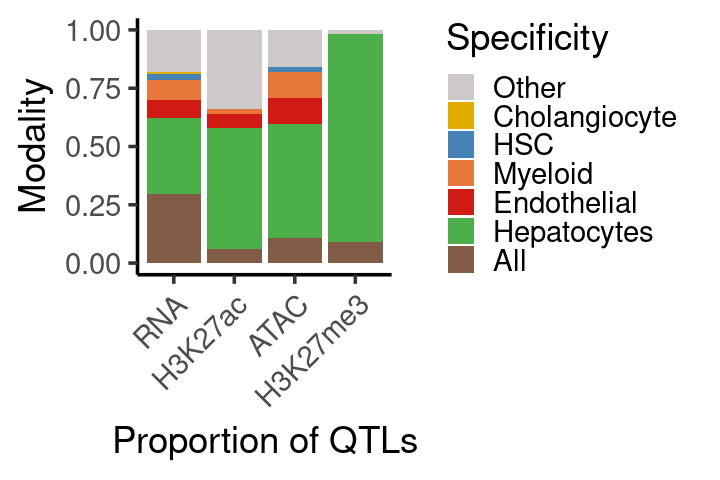

In [34]:
options(repr.plot.width=6, repr.plot.height=4)
ggplot.data$category <- factor(ggplot.data$category, 
                               levels=rev(c('All','Hepatocytes','Endothelial','Myeloid','HSC','Cholangiocyte','Other')))
ggplot.data$modality <- factor(ggplot.data$modality, levels=c('RNA','H3K27ac','ATAC','H3K27me3'))
p1 <- ggplot(ggplot.data, aes(x=modality, y=prop, fill=category)) + 
    geom_col() +
    theme_classic(base_size=22) +
    scale_fill_manual(values=spec_colors) +
    labs(x='Proportion of QTLs', y='Modality', fill='Specificity') +
    theme(axis.text.x = element_text(angle = 45, vjust = 1, hjust=1))
p1 

pdf('/nfs/lab/welison/Liver/Plots/241222_QTL_specificity_Barplot.pdf', width=6, height=4)
p1
dev.off()